In [5]:
import os
import sys
sys.path.insert(0, '/tf')
import sionna
import importlib
#importlib.reload(sionna)

In [6]:
from sionna.rt import RIS

In [4]:

gpu_num = "" # Use "" to use the CPU
os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Colab does currently not support the latest version of ipython.
# Thus, the preview does not work in Colab. However, whenever possible we
# strongly recommend to use the scene preview mode.
try: # detect if the notebook runs in Colab
    import google.colab
    colab_compat = True # deactivate preview
except:
    colab_compat = False
resolution = [480,320] # increase for higher quality of renderings

# Allows to exit cell execution in Jupyter
class ExitCell(Exception):
    def _render_traceback_(self):
        pass

# Import Sionna
try:
    import sionna
    #reload(sionna)
except ImportError as e:
    # Install Sionna if package is not already installed
    import os
    os.system("pip install sionna")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
# For more details, see https://www.tensorflow.org/guide/gpu
import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)
# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

tf.random.set_seed(1) # Set global random seed for reproducibility


NameError: name 'reload' is not defined

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import time

# Import Sionna RT components
from sionna.rt import load_scene, Transmitter, Receiver, PlanarArray, Camera, RIS

# For link-level simulations
from sionna.channel import cir_to_ofdm_channel, subcarrier_frequencies, OFDMChannel, ApplyOFDMChannel, CIRDataset
from sionna.nr import PUSCHConfig, PUSCHTransmitter, PUSCHReceiver
from sionna.utils import compute_ber, ebnodb2no, PlotBER
from sionna.ofdm import KBestDetector, LinearDetector
from sionna.mimo import StreamManagement


ImportError: cannot import name 'RIS' from 'sionna.rt' (/usr/local/lib/python3.8/dist-packages/sionna/rt/__init__.py)

Define RIS channel function

In [10]:
def ris_channel(scene,ris_array,pos,ori):
        tx = scene.get("tx")
        rx = scene.get("rx")
        
        # Remove rx and make ris act as receiver
        scene.remove("rx")
        scene.rx_array = ris_array
        ris_node = Receiver(name="ris",position=pos,orientation=ori)
        scene.add(ris_node)
        paths1 = scene.compute_paths(max_depth=1, num_samples=30e6)
        
        # Remove tx and make ris act as transmitter
        scene.remove("tx")
        scene.remove("ris")
        scene.tx_array = ris_array
        ris_node = Transmitter(name="ris",position=pos,orientation=ori)
        scene.add(ris_node)
        scene.add(rx)
        paths2 = scene.compute_paths(max_depth=1, num_samples=30e6)
        
        # Make the scene look how it is before adding the ris. Hence remove ris
        scene.remove("ris")
        scene.add(tx)
        
        return paths1,paths2

In [4]:
# Load integrated scene
#scene = load_scene(sionna.rt.scene.simple_reflector) # Try also sionna.rt.scene.etoile
scene = load_scene("test_scenes/box.xml")

Create a tx + rx setup 

In [60]:
scene.remove("tx")
scene.remove("rx")
scene.remove("ris")
# Configure antenna array for all transmitters
scene.tx_array = PlanarArray(num_rows=2,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="V")

# Configure antenna array for all receivers
scene.rx_array = PlanarArray(num_rows=2,
                             num_cols=1,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="V")

# Create transmitter
tx = Transmitter(name="tx",
                 position=[-3,0,2.5])

# Add transmitter instance to scene
scene.add(tx)

# Create a receiver
rx = Receiver(name="rx",
              position=[4,0,2.5],
              orientation=[0,0,0])

# Add receiver instance to scene
scene.add(rx)

tx.look_at(rx) # Transmitter points towards receiver


Create a sample ris array

In [61]:
ris_array = PlanarArray(num_rows=2,
                             num_cols=2,
                             vertical_spacing=0.5,
                             horizontal_spacing=0.5,
                             pattern="dipole",
                             polarization="V")
pos = [2,-1,2.5]
ori = [0,np.pi/2,0]
ris = Receiver(name = "ris",position=pos,color=(1,0,0))

Trying double ray tracing once from tx to ris and then from ris to rx


In [62]:
scene.remove("ris")
(paths1,paths2) = ris_channel(scene,ris_array,pos,ori) 
scene.add(ris)

Tx to RIS ray tracing

In [63]:
# Visualize paths in the 3D preview
if colab_compat:
    scene.render("my_cam", paths=paths1, show_devices=True, show_paths=True, resolution=resolution);
    raise ExitCell
scene.preview(paths1, show_devices=True, show_paths=True) # Use the mouse to focus on the visualized paths
#scene.preview(paths2, show_devices=True, show_paths=True) # Use the mouse to focus on the visualized paths

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, matrixWorldNeedsUpda…

RIS to Ray tracing

In [64]:
scene.preview(paths2, show_devices=True, show_paths=True) # Use the mouse to focus on the visualized paths

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, matrixWorldNeedsUpda…

In [50]:
print("Source coordinates: ", paths1.sources.numpy())
print("Source coordinates: ", paths2.sources.numpy())

Source coordinates:  [[-3.   0.   2.5]]
Source coordinates:  [[ 2.  -1.   2.5]]


In [54]:
a1, tau1 = paths1.cir()
a2, tau2 = paths2.cir()
a1 = a1[0,0,0,0,0,:,0]
a2 = a2[0,0,0,0,0,:,0]
t1 = tau1[0,0,0,:]/1e-9
t2 = tau2[0,0,0,:]/1e-9
print(a2.shape)
print(t2.shape)

(6,)
(6,)


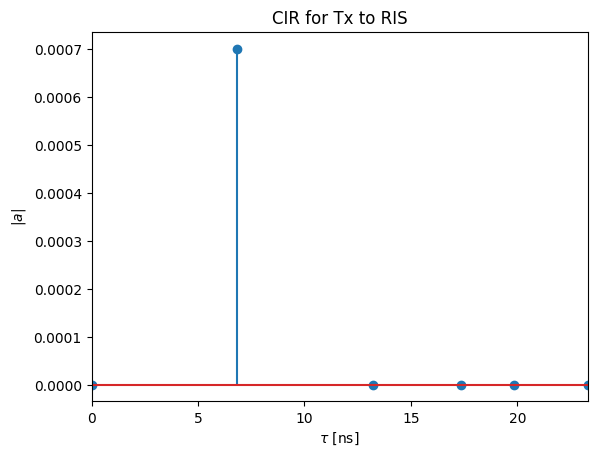

In [57]:
# Plot the CIR for paths1
plt.figure()
plt.title("CIR for Tx to RIS")

plt.stem(t1, np.abs(a1))
plt.xlim([0, np.max(t1)])
#plt.ylim([-2e-6, a_max*1.1])
plt.xlabel(r"$\tau$ [ns]")
plt.ylabel(r"$|a|$");

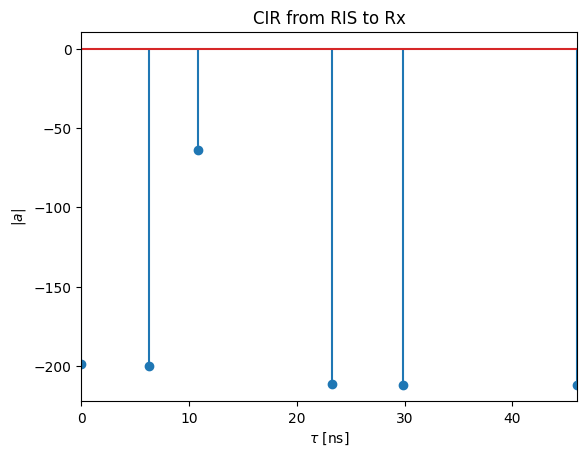

In [59]:
# Plot the CIR for paths2
plt.figure()
plt.title("CIR from RIS to Rx")

plt.stem(t2, np.abs(a2))
plt.xlim([0, np.max(t2)])
#plt.ylim([-2e-6, a_max*1.1])
plt.xlabel(r"$\tau$ [ns]")
plt.ylabel(r"$|a|$");

In [56]:
print (a1)

tf.Tensor(
[ 2.1496031e-11+7.5448890e-11j  0.0000000e+00+0.0000000e+00j
 -8.9153269e-05+6.9592369e-04j -5.3008431e-11-1.1614981e-11j
 -1.3257712e-11+6.4420843e-12j  1.1274037e-11+1.2343539e-11j
  1.1317334e-11-3.1871603e-11j], shape=(7,), dtype=complex64)
